## Imports and Setup

#### Imports

In [ ]:
from rp import *
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim

#### Config

In [2]:
%config InlineBackend.figure_format='retina'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### Helper Functions

In [3]:
def display_images(images):
    display_image(tiled_images(images))

#Unused functions are commented out
    
# def as_numpy_image(image):
#     if isinstance(image,np.ndarray):
#         return image.copy()
#     else:
#         return as_numpy_images(image.unsqueeze(0))[0]
    
# def display_image(image):
#     #Make display_image also work with Torch tensors
#     if isinstance(image,torch.Tensor):
#         image=as_numpy_image(image)
#     rp.display_image(image)

## Albedo Mapper

#### Prepare example data

r.eta: ETR=0:00:04.833475	ETA=0:00:05.178723	T=0:00:00.345248	Progress: 1/15rp.load_images: Done! Loaded 15 images in 0.441 seconds
A random cube model:


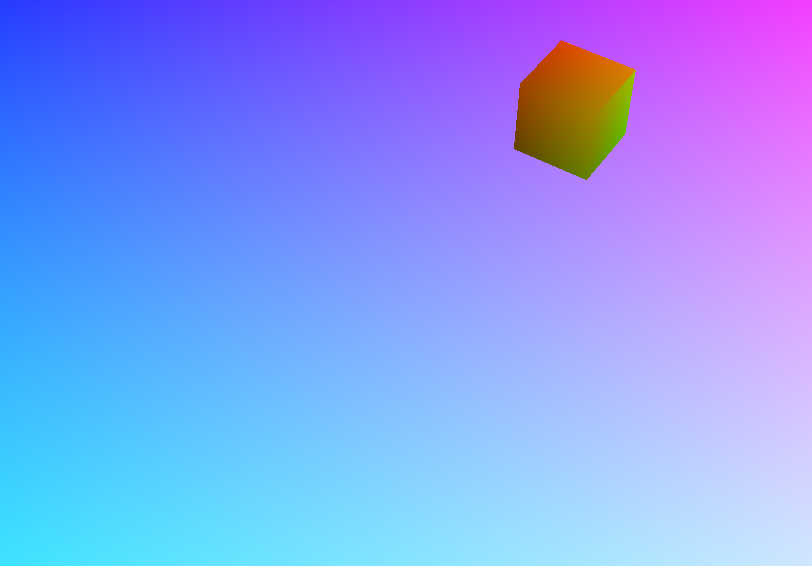

In [4]:
image_paths=get_all_files('/home/ryan/CleanCode/Datasets/diff_rendering/steve/UV_Cubes',sort_by='number')
image_paths=get_all_files('/home/ryan/CleanCode/Datasets/diff_rendering/alphabetcube_L/CroppedHalvedUV',sort_by='number')
image_paths=image_paths[:15] #For the previews, limit the number of samples. It makes the .ipynb files smaller.
cube_models=load_images(image_paths,show_progress=True,use_cache=True)
cube_models=[as_float_image(cube_model) for cube_model in cube_models]
cube_models=as_numpy_array(cube_models)
print("A random cube model:")
display_image(random_element(cube_models))

Albedo Map:


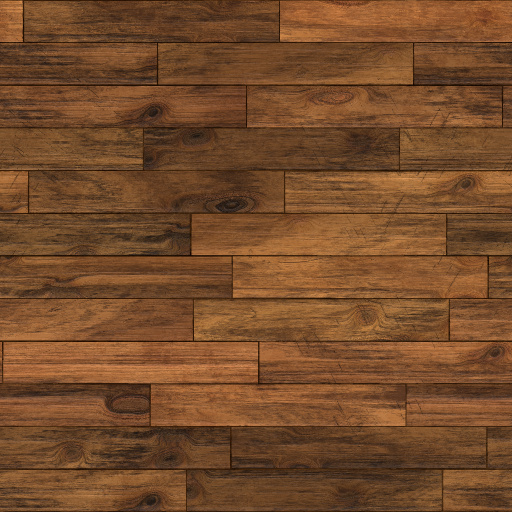

In [5]:
stone='https://www.filterforge.com/filters/12449.jpg'
tiles='https://filterforge.com/filters/10857-v4.jpg'
wood='https://filterforge.com/filters/8892.jpg'
paved='https://filterforge.com/filters/14157.jpg'

albedo=wood

albedo=load_image(albedo,use_cache=True)
# albedo=resize_image(albedo,(256,256))
print("Albedo Map:")
display_image(albedo)

In [6]:
#### Numpy Implementation

In [7]:
def apply_albedo_via_numpy(model,albedo):
    
    assert is_image(model)
    assert is_rgb_image(albedo)
    assert is_rgb_image(model) or is_rgba_image(model)
    
    model=as_float_image(model)
    
    albedo_height,albedo_width=get_image_dimensions(albedo)
    model_height ,model_width =get_image_dimensions(model )
    
    r=model[:,:,0]
    g=model[:,:,1]
    
    u=np.minimum((r*albedo_width ).astype(int),albedo_width -1)
    v=np.minimum((g*albedo_height).astype(int),albedo_height-1)
    
    output=albedo[v.flatten(),u.flatten()]
    output=output.reshape((model_height,model_width,3))
    
    #Black background stays black
    mask=1-(r==0)*(g==0)
    mask=np.expand_dims(mask,2)
    mask=mask.astype(np.uint8)
    output=mask*output
    
    return output

In [8]:
rendered_cubes=[apply_albedo_via_numpy(model,albedo) for model in cube_models]

In [9]:
print('Models before and after applying the albedo')
model_rendering_pairs=horizontally_concatenated_videos(cube_models,rendered_cubes)
display_image_slideshow(model_rendering_pairs);

Models before and after applying the albedo


Once 
 
 Loop 
 
 Reflect

Second Albedo Map:


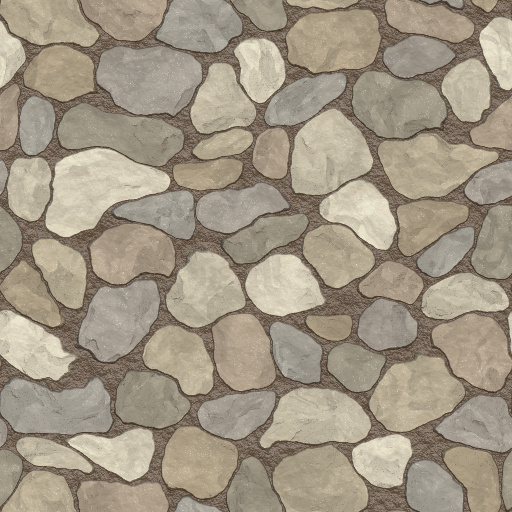

In [10]:
second_albedo=paved

second_albedo=load_image(second_albedo,use_cache=True)
print("Second Albedo Map:")
display_image(second_albedo)

In [11]:
def condense_values(tensor,values):
    #Mutates the given tensor and returns it
    #   - tensor: can be either torch.Tensor or np.ndarray
    #   - values: should be a list of int
    #    
    # EXAMPLES:
    #     >>> condense_values(torch.Tensor([4,2,3,6,8,1]),[1,3,8])
    #    ans = tensor([4., 2., 1., 6., 2., 0.])
    #     >>> condense_values(torch.tensor([4,2,3,6,8,1]),[1,3,8])
    #    ans = tensor([4, 2, 1, 6, 2, 0])
    #     >>> condense_values(torch.tensor([4,2,3,6,8,1]),[1,2,3,4])
    #    ans = tensor([3, 1, 2, 6, 8, 0])
    #     >>> condense_values(torch.tensor([2,5,7,9]),[2,5,9])
    #    ans = tensor([0, 1, 7, 2])
    #     >>> condense_values(torch.tensor([2,5,7,9]),[2,5,7,9])
    #    ans = tensor([0, 1, 2, 3])
    #    
    #I'm having a hard time coming up with an intuitive explanation
    #for exactly what this function does...but know that it's used
    #to let us specify which values of the b channel we're using from
    #the model images, so we can use multiple textures efficiently
    #See the uses of this function for a better explanation...
    
    values=sorted(values)
    for index,value in enumerate(values):
        tensor[tensor==value]=index
    return tensor

In [12]:
def apply_albedos_via_numpy(model,albedos:dict):
    
    #NOTE: This has not been tested with albedo ID's other than 0 and 255 yet
    
    assert isinstance(albedos,dict)
    assert all(isinstance(key,int) for key in albedos)
    assert all(0<=key<=255 for key in albedos),'All albedo IDs should be encoded in the blue channel with values between 0 and 255'
    assert is_image(model)
    assert all(is_rgb_image(albedo) for albedo in albedos.values())
    assert is_rgb_image(model) or is_rgba_image(model)
    
    albedo_dimensions=set(get_image_dimensions(albedo) for albedo in albedos.values())
    assert len(albedo_dimensions)==1,'All albedos should be the same size'
    albedo_dimensions=albedo_dimensions.pop()
    
    # model=as_byte_image(model) # Uncomment this line if you want to see how much worse the mapping is without EXR's
    model=as_float_image(model)
    
    model_height,model_width=get_image_dimensions(model)
    
    r=model[:,:,0]
    g=model[:,:,1]
    b=model[:,:,2]
    
    albedo_height,albedo_width=albedo_dimensions
    u=np.minimum((r*albedo_width ).astype(int),albedo_width -1)
    v=np.minimum((g*albedo_height).astype(int),albedo_height-1)
    i=np.minimum(np.round(b*256).astype(int),255) #Albedo ID
    i=condense_values(i,list(albedos))
    
    albedo=np.asarray([albedos[key] for key in sorted(albedos)])
    
    output=albedo[i.flatten(),v.flatten(),u.flatten()]
    output=output.reshape((model_height,model_width,3))
    
    #Black background stays black
    mask=1-(r==0)*(g==0)
    mask=np.expand_dims(mask,2)
    mask=mask.astype(np.uint8)
    output=mask*output
    
    return output

In [13]:
rendered_cubes=[apply_albedos_via_numpy(model,{0:albedo,255:second_albedo}) for model in cube_models]

In [14]:
print('Models before and after applying the albedos')
model_rendering_pairs=horizontally_concatenated_videos(cube_models,rendered_cubes)
display_image_slideshow(model_rendering_pairs);

Models before and after applying the albedos


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f4bda04c3a0> (for post_execute):


KeyboardInterrupt: 

#### Pytorch Implementation

In [ ]:
def apply_albedo_via_torch(models,albedo):
    
    assert len(albedo.shape)==3 and albedo.shape[2]==3,'Albedo shape should be like (512,512,3) or (256,128,3) etc'
    
    albedo_height,albedo_width=albedo.shape[:2]
    models_height,models_width=models.shape[2:]
    
    r=models[:,0,:,:]
    g=models[:,1,:,:]
    
    u=torch.clamp(r*albedo_height,min=0,max=albedo_height-1).type(torch.long)
    v=torch.clamp(g*albedo_width ,min=0,max=albedo_width -1).type(torch.long)
    
    output=albedo[v.flatten(),u.flatten()]
    output=output.reshape(r.shape+(-1,))
    output=output.permute(0,3,1,2)

    #Make black pixels in the model black in the rendering too
    mask=~((r==0)*(g==0))
    mask=mask.unsqueeze(1)
    output=output*mask
    
    return output

In [ ]:
torch_cube_models=as_torch_images(cube_models)
torch_albedo=torch.tensor(albedo)

In [ ]:
torch_rendered_cubes=apply_albedo_via_torch(torch_cube_models,torch_albedo)

In [ ]:
print("Rendered images from torch: should look identical to the previous animation on every frame")
display_image_slideshow(as_numpy_images(torch_rendered_cubes))

In [ ]:
def apply_albedos_via_torch(models,albedos:dict):
    
    assert isinstance(albedos,dict)
    assert all(isinstance(key,int) for key in albedos)
    assert all(0<=key<=255 for key in albedos),'All albedo IDs should be encoded in the blue channel with values between 0 and 255'
    
    
    albedo_shapes=set(albedo.shape for albedo in albedos.values())
    assert len(albedo_shapes)==1,'All albedos should be the same size'
    albedo_shape=albedo_shapes.pop()
    assert len(albedo_shape)==3 and albedo_shape[2]==3,'Albedo shape should be like (512,512,3) or (256,128,3) etc'
    
    albedo_height,albedo_width=albedo_shape[:2]
    models_height,models_width=models.shape[2:]
    
    r=models[:,0,:,:]
    g=models[:,1,:,:]
    b=models[:,2,:,:]
    
    u=torch.clamp(r*albedo_height   ,min=0,max=albedo_height-1).type(torch.long)
    v=torch.clamp(g*albedo_width    ,min=0,max=albedo_width -1).type(torch.long)
    i=torch.clamp(torch.round(b*256),min=0,max=255            ).type(torch.long)
    i=condense_values(i,list(albedos))
    
    albedo=torch.stack([albedos[key] for key in sorted(albedos)])
    
    output=albedo[i.flatten(),v.flatten(),u.flatten()]
    output=output.reshape(r.shape+(-1,))
    output=output.permute(0,3,1,2)

    #Make black pixels in the model black in the rendering too
    mask=~((r==0)*(g==0))
    mask=mask.unsqueeze(1)
    output=output*mask
    
    return output

In [ ]:
torch_second_albedo=torch.tensor(second_albedo)

In [ ]:
torch_rendered_cubes=apply_albedos_via_torch(torch_cube_models,{0:torch_albedo,255:torch_second_albedo})

In [ ]:
print("Rendered images from torch: should look identical to the previous animation on every frame")
display_image_slideshow(as_numpy_images(torch_rendered_cubes))

## Subsequent Cells (edit this title later)

#### Settings

In [ ]:
#HYPERPARAMETERS
albedo_size=256
image_size=128
# models_folder='/home/ryan/CleanCode/Datasets/diff_rendering/steve/UV_Cubes'
# photos_folder='/home/ryan/CleanCode/Datasets/diff_rendering/steve/Steve_Cubes'
models_folder='/home/ryan/CleanCode/Datasets/diff_rendering/alphabetcube_L/CroppedHalvedUV'
photos_folder='/home/ryan/CleanCode/Datasets/diff_rendering/alphabetcube_L/CroppedHalvedPhotos'
batch_size=8
learning_rate_discriminator=.0002
learning_rate_generator=learning_rate_discriminator*10
beta1 = 0.5 # Beta1 hyperparam for Adam optimizers
num_epochs=500
dream_steps=1

#### Dataset Preparation

In [ ]:
dataset_transform=transforms.Compose([
        as_rgb_image,
        as_float_image,
        transforms.ToTensor(),
        lambda tensor:tensor.to(device)
    ])

models_dataset=ImageDataset(models_folder,transform=dataset_transform)
photos_dataset=ImageDataset(photos_folder,transform=dataset_transform)

def make_dataloader(dataset):
    return torch.utils.data.DataLoader(dataset,
                                       batch_size=batch_size,
                                       shuffle=True)

models_dataloader = make_dataloader(models_dataset)
photos_dataloader = make_dataloader(photos_dataset)

In [ ]:
def preview_datasets(num_samples=4):
    print("Some Photos:")
    display_images(as_numpy_images(next(iter(photos_dataloader)))[:num_samples])

    print()

    print("Some Models:")
    display_images(as_numpy_images(next(iter(models_dataloader)))[:num_samples])
    
    #Make sure the images' values are between 0 and 1
    icecream.ic(next(iter(models_dataloader)).min(),next(iter(models_dataloader)).max())
    icecream.ic(next(iter(photos_dataloader)).min(),next(iter(photos_dataloader)).max())

preview_datasets()

#### Learable Parametric Images

In [ ]:
import urllib.request
import cv2
import imageio
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import tqdm
from rp import *
from torch import nn
from tqdm.notebook import tqdm as tqdm

In [ ]:
class GaussianFourierFeatureTransform:
    """
    Original authors: https://github.com/ndahlquist/pytorch-fourier-feature-networks
    
    An implementation of Gaussian Fourier feature mapping.

    "Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains":
       https://arxiv.org/abs/2006.10739
       https://people.eecs.berkeley.edu/~bmild/fourfeat/index.html

    Given an input of size [batches, num_input_channels, width, height],
     returns a tensor of size [batches, mapping_size*2, width, height].
    """

    def __init__(self, num_input_channels, mapping_size=256, scale=10):
        super().__init__()

        self._num_input_channels = num_input_channels
        self._mapping_size = mapping_size
        self._B = torch.randn((num_input_channels, mapping_size)) * scale

    def __call__(self, x):
        assert x.dim() == 4, 'Expected 4D input (got {}D input)'.format(x.dim())

        batches, channels, width, height = x.shape

        assert channels == self._num_input_channels,\
            "Expected input to have {} channels (got {} channels)".format(self._num_input_channels, channels)

        # Make shape compatible for matmul with _B.
        # From [B, C, W, H] to [(B*W*H), C].
        x = x.permute(0, 2, 3, 1).reshape(batches * width * height, channels)

        x = x @ self._B.to(x.device)

        # From [(B*W*H), C] to [B, W, H, C]
        x = x.view(batches, width, height, self._mapping_size)
        # From [B, W, H, C] to [B, C, W, H]
        x = x.permute(0, 3, 1, 2)

        x = 2 * np.pi * x
        return torch.cat([torch.sin(x), torch.cos(x)], dim=1)

In [ ]:
def get_xy_grid(height:int,width:int,batch_size:int=1)->torch.Tensor:
    #Returns a torch cpu tensor of shape (batch_size,2,height,width)
    #The second dimension is (x,y) coordinates, which go from [0 to 1) from edge to edge
    #(In other words, it will include x=y=0, but instead of x=y=1 the other corner will be x=y=.999)
    assert height>0 and width>0 and batch_size>0,'All dimensions must be positive integers'
    
    y_coords = np.linspace(0, 1, height, endpoint=False)
    x_coords = np.linspace(0, 1, width , endpoint=False)
    xy_grid = np.stack(np.meshgrid(y_coords, x_coords), -1)
    xy_grid = torch.tensor(xy_grid).unsqueeze(0).permute(0, 3, 1, 2).float().contiguous()
    xy_grid = xy_grid.repeat(batch_size,1,1,1)
    
    assert tuple(xy_grid.shape)==(batch_size,2,height,width)
    
    return xy_grid

In [ ]:
class LearnableImageViaFourierFeatures(nn.Module):
    def __init__(self,
                 height=256,       # Height of the learnable images
                 width=256,        # Width of the learnable images
                 num_channels=3,   # Number of channels in the images
                 hidden_dim=256,   # Number of dimensions per hidden layer of the MLP
                 mapping_size=128, # Number of fourier features per coordinate
                 scale=10,         # Magnitude of the initial feature noise
                 device='cpu',     # Please set this correctly if you want GPU
                ):
        super().__init__()
        
        self.height      =height
        self.width       =width
        self.batch_size  =batch_size
        self.num_channels=num_channels
        self.mapping_size=mapping_size
        self.scale       =scale
        self.device      =device
        
        # The following objects do NOT have parameters, and are not changed while optimizing this class
        self.xy_grid =get_xy_grid(height,width,batch_size=1).to(device)
        self.feature_extractor=GaussianFourierFeatureTransform(2, mapping_size, scale)
        self.features=self.feature_extractor(self.xy_grid).to(device) # pre-compute this if we're regressing on images
        
        H=hidden_dim # Number of hidden features. These 1x1 convolutions act as a per-pixel MLP
        C=num_channels  # Shorter variable names let us align the code better
        M=2*mapping_size
        self.model = nn.Sequential(
                nn.Conv2d(M, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, H, kernel_size=1), nn.ReLU(), nn.BatchNorm2d(H),
                nn.Conv2d(H, C, kernel_size=1),
                nn.Sigmoid(),
            ).to(device)
    
    def project(self,uv_maps):
        assert len(uv_maps.shape)==(4)
        assert uv_maps.shape[1]==2 # Should have two channels: u,v
        return self.model(self.feature_extractor(uv_maps))
    
    def forward(self):
        # Return all the image we've learned
        return self.model(self.features).squeeze(0).permute(1,2,0)

#### Torch Model Preparation

In [ ]:
class LearnableImage(nn.Module):
    def __init__(self,
                 height:int,
                 width :int,
                 num_channels=3
                ):
        super().__init__()

        self.image=nn.Parameter(torch.rand(height,width,num_channels))
        
    def forward(self):
        return self.image
    
    def as_numpy_image(self):
        image=self.image
        image=as_numpy_array(image)
        image=image.transpose(1,2,0)
        return image

In [ ]:
class ImageResizer(nn.Module):
    def __init__(self,image_size:int=image_size):
        super().__init__()
        self.height=self.width=image_size
        self.resizer=nn.AdaptiveAvgPool2d((self.height,self.width))
    
    def forward(self,images):
        return self.resizer(images)

In [ ]:
class Generator(nn.Module):
    # The Old Version
    # TODO: Make this work with multiple textures. Just copy the procedure used for the FourierNeuralGenerator.
    def __init__(self,albedo_size=albedo_size):
        super().__init__()
        self.albedo=LearnableImage(height=albedo_size,
                                   width=albedo_size)
        
    def forward(self,models:torch.Tensor):
        renderings=apply_albedo_via_torch(models,self.albedo())
        return renderings

class NeuralFourierGenerator(nn.Module):
    def __init__(self,
                 albedo_ids:list,
                 albedo_size=albedo_size
                ):

        # Setting rasterize=True makes rendering batch_size times faster and much more memory efficient
        # However, it's not theoretically continuous anymore - and we must use pixel-wise interpolation
        # Frankly, however, I expect that with a sufficient resolution you won't notice the difference
        
        assert all(isinstance(albedo_id,int) for albedo_id in albedo_ids)
        
        super().__init__()
        
        self.albedos={'A'+str(albedo_id):LearnableImageViaFourierFeatures(height=albedo_size,
                                                                      width =albedo_size,
                                                                      device=device) for albedo_id in albedo_ids}
        self.albedos=nn.ModuleDict(self.albedos)
    
    def calculate_albedos(self):
        return {int(albedo_id[1:]):albedo() for albedo_id,albedo in self.albedos.items()}
    
    def forward(self, models:torch.Tensor):
        return apply_albedos_via_torch(models,self.calculate_albedos())
    
Generator=NeuralFourierGenerator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):

        # Number of channels in the training images. For color images this is 3
        nc = 3

        # Size of feature maps in discriminator
        ndf = 64
        
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
        # Apply the weights_init function to randomly initialize all weights
        #  to mean=0, stdev=0.2.
        self.apply(self.weights_init)

    def forward(self, input):
        input=input.type(torch.float32)
        return self.main(input)

    @staticmethod
    def weights_init(m):
        # From the DCGAN paper, the authors specify that all model weights shall
        # be randomly initialized from a Normal distribution with mean=0,
        # stdev=0.02. The ``weights_init`` function takes an initialized model as
        # input and reinitializes all convolutional, convolutional-transpose, and
        # batch normalization layers to meet this criteria. This function is
        # applied to the models immediately after initialization.
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

In [ ]:
generator=Generator(albedo_ids=[0,255]).to(device)
resizer=ImageResizer().to(device)
discriminator=Discriminator().to(device)

optimizer_discriminator=optim.Adam(discriminator.parameters(),
                                   lr=learning_rate_discriminator,
                                   betas=(beta1, 0.999))
optimizer_generator    =optim.Adam(generator.parameters(),
                                   lr=learning_rate_generator,
                                   betas=(beta1, 0.999))

criterion=nn.BCELoss()
# criterion=nn.MSELoss()

In [ ]:
def display_albedo_preview():
    print("The albedo maps")
    for albedo in generator.calculate_albedos().values():
        display_image(as_numpy_array(albedo))

    print("Some sample renderings")
    display_images(as_numpy_images(resizer(generator(next(iter(models_dataloader)))))[:16])

In [ ]:
next(iter(models_dataloader)).shape

In [ ]:
print("The initial state:")
display_albedo_preview()

In [ ]:
discriminator_losses=[]
generator_losses=[]

In [ ]:
print("Starting Training Loop...")

for epoch in range(num_epochs):
    
    batches=zip(models_dataloader,photos_dataloader)
    len_batches=min(len(models_dataloader),len(photos_dataloader))
    
    display_eta=eta(len_batches)
    
    for iteration, (models,photos) in enumerate(batches):
        
        #Part 1: Gather data
        photos=resizer(photos)
       
        
        #Part 2: Optimize the discriminator
        renderings = generator(models)
        renderings = resizer(renderings)
        
        discriminator.zero_grad()
        
        predicted = discriminator(photos)
        label = torch.ones_like(predicted)
        photo_loss = criterion(predicted, label)
                
        predicted = discriminator(renderings)
        label = torch.zeros_like(predicted)
        rendering_loss = criterion(predicted, label)
        
        discriminator_loss = photo_loss + rendering_loss
        discriminator_loss.backward()
        
        optimizer_discriminator.step()
        
        
        #Part 3: Optimize the generator
        
        for _ in range(dream_steps):
            generator.zero_grad()
            
            renderings = generator(models)
            renderings = resizer(renderings)
            
            predicted = discriminator(renderings)
            label = torch.ones_like(predicted)
            generator_loss = criterion(predicted, label)
            generator_loss.backward()
            
            optimizer_generator.step()
            
        #Part 4: Log data
        generator_losses    .append(generator_loss    .mean().item())
        discriminator_losses.append(discriminator_loss.mean().item())
        
        display_eta(iteration)
        
    if epoch % 1 == 0:
        
        print('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
              % (epoch, num_epochs,
                 discriminator_losses[-1], generator_losses[-1]))
        
        display_albedo_preview()
        
        print('\n'*3)
        
        
        
        

To try next:
CycleGAN with this dataset
Label the objects somehow. Give it hints. Not exactly sure how to do this though.